In [117]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io 
import os

# Configuração de visualização
def show_steps(images, titles):
    n = len(images)
    plt.figure(figsize=(15, 5))
    for i in range(n):
        plt.subplot(1, n, i+1)
        plt.imshow(images[i], cmap='gray')
        plt.title(titles[i])
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Carregar uma imagem de exemplo do dataset (substitua pelo caminho do seu arquivo)
# dataset cancer-6tio2
image_path = 'Test1.jpg' 

img_raw = io.imread(image_path)

# Conversão para tons de cinza (Y = 0.299R + 0.587G + 0.114B) - Cap. 6 G&W
if len(img_raw.shape) == 3:
    img_gray = np.dot(img_raw[...,:3], [0.299, 0.587, 0.114])
else:
    img_gray = img_raw

print(f"Imagem carregada. Dimensões: {img_gray.shape}")

Imagem carregada. Dimensões: (722, 962)


## 2. Pré-processamento: Suavização Espacial

Imagens dermatoscópicas frequentemente contêm ruídos de alta frequência, como pelos, bolhas de ar ou textura da pele, que podem prejudicar a segmentação. Para mitigar isso, aplicamos um **Filtro Gaussiano** (Passa-Baixa).

Conforme descrito no **Capítulo 3 (Filtering in the Spatial Domain)** do Gonzalez & Woods, a suavização é realizada pela convolução da imagem $f(x,y)$ com um kernel Gaussiano $w(s,t)$:

$$g(x,y) = w(x,y) \ast f(x,y)$$

Onde o kernel Gaussiano 2D é definido por:
$$G(x, y) = \frac{1}{2\pi\sigma^2} e^{-\frac{x^2 + y^2}{2\sigma^2}}$$

Isso resulta em uma imagem onde as transições abruptas de intensidade (ruído) são atenuadas, preservando as estruturas maiores (a lesão).

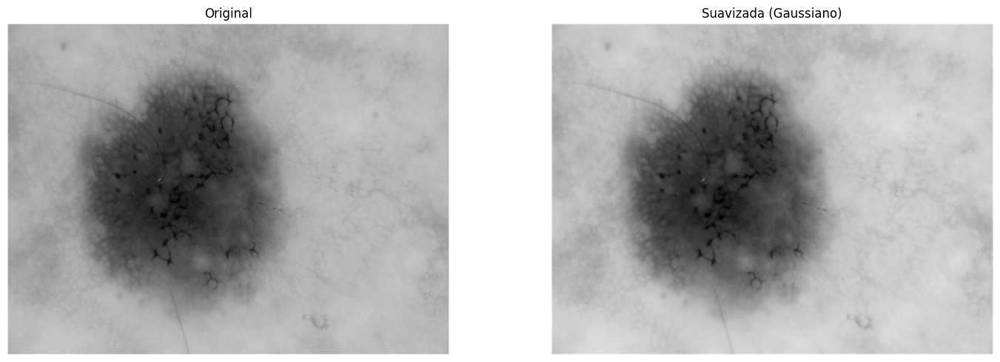

In [118]:
def gaussian_kernel(size, sigma=1):
    """Cria um kernel Gaussiano 2D manual."""
    ax = np.linspace(-(size - 1) / 2., (size - 1) / 2., size)
    xx, yy = np.meshgrid(ax, ax)
    kernel = np.exp(-0.5 * (np.square(xx) + np.square(yy)) / np.square(sigma))
    return kernel / np.sum(kernel)

def convolve2d(image, kernel):
    """Implementação 'naive' de convolução 2D"""
    h_k, w_k = kernel.shape
    h_i, w_i = image.shape
    
    # Padding (borda) para manter o tamanho da imagem
    pad_h = h_k // 2
    pad_w = w_k // 2
    padded_img = np.pad(image, ((pad_h, pad_h), (pad_w, pad_w)), mode='reflect')
    
    output = np.zeros_like(image)
    
    # Loop de convolução (Cap. 3.4)
    # Pooderia ser usada a FFT, mas aqui queremos ver a soma ponderada
    for i in range(h_i):
        for j in range(w_i):
            region = padded_img[i:i+h_k, j:j+w_k]
            output[i, j] = np.sum(region * kernel)
            
    return output

# Aplicando
kernel = gaussian_kernel(size=5, sigma=1.0)
img_smooth = convolve2d(img_gray, kernel)

show_steps([img_gray, img_smooth], ["Original", "Suavizada (Gaussiano)"])

## 3. Segmentação Global: Método de Otsu

Para separar a lesão (foreground) da pele saudável (background), utilizamos o **Método de Otsu**, abordado no **Capítulo 10 (Image Segmentation)**. Este é um método de limiarização ótimo global que não requer supervisão humana.

O algoritmo busca um limiar $k$ que maximize a **variância entre classes** ($\sigma_B^2$). Matematicamente, para uma imagem com níveis de cinza $L$, buscamos $k^*$ tal que:

$$\sigma_B^2(k^*) = \max_{0 \le k < L-1} \sigma_B^2(k)$$

A variância entre classes é calculada como:
$$\sigma_B^2(k) = P_1(k)P_2(k)[\mu_1(k) - \mu_2(k)]^2$$

Onde:
* $P_1, P_2$: Probabilidades (área relativa) das classes 1 e 2.
* $\mu_1, \mu_2$: Médias de intensidade das classes.

Ao maximizar a separação estatística entre os picos do histograma, obtemos a máscara binária inicial.

Limiar de Otsu calculado: 129


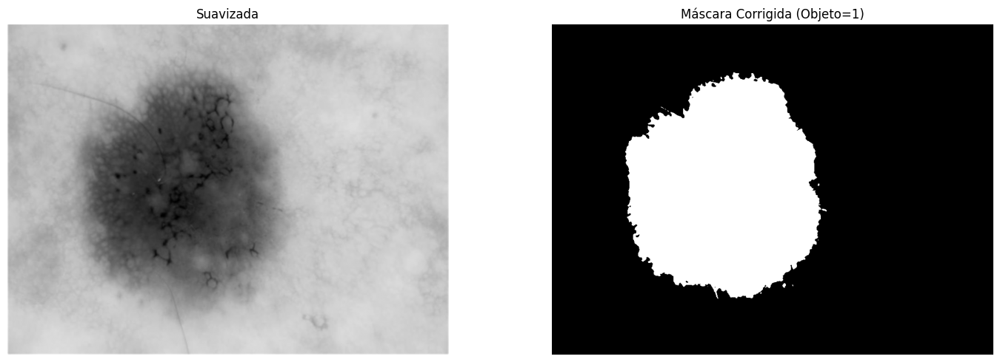

In [119]:
def otsu_threshold(image):
    """Implementação do Algoritmo de Otsu (Cap. 10.3.3)."""
    # 1. Calcular histograma normalizado
    pixel_counts, bins = np.histogram(image, bins=256, range=(0,256))
    total_pixels = image.size
    p = pixel_counts / total_pixels # Probabilidade de cada nível
    
    # Variáveis auxiliares
    sigma_b_squared_max = 0
    optimal_k = 0
    
    # Momentos acumulados (w0, w1) e Médias acumuladas (mu0, mu1)
    # Loop através de todos os limiares possíveis k (0 a 255)
    for k in range(256):
        w0 = np.sum(p[:k+1])
        w1 = np.sum(p[k+1:])
        
        if w0 == 0 or w1 == 0: continue
            
        mu0 = np.sum(np.arange(k+1) * p[:k+1]) / w0
        mu1 = np.sum(np.arange(k+1, 256) * p[k+1:]) / w1
        
        # Variância entre classes (Eq. 10.3-14 do G&W)
        sigma_b_squared = w0 * w1 * ((mu0 - mu1) ** 2)
        
        if sigma_b_squared > sigma_b_squared_max:
            sigma_b_squared_max = sigma_b_squared
            optimal_k = k
            
    return optimal_k


try:
    threshold_val = otsu_threshold_manual(img_smooth)
    
    # Usei < em vez de >
    # Motivo: Suas células são escuras (valores baixos) e o fundo é claro (valores altos).
    # Isso garante: Célula = 1 (Branco), Fundo = 0 (Preto)
    binary_mask = (img_smooth < threshold_val).astype(np.uint8)

    print(f"Limiar de Otsu calculado: {threshold_val}")
    
    # Visualização: O objeto de interesse deve aparecer BRANCO agora
    show_steps([img_smooth, binary_mask], ["Suavizada", "Máscara Corrigida (Objeto=1)"])

except NameError:
    print("Erro: A variável 'img_smooth' não foi encontrada. Rode a célula do Filtro Gaussiano primeiro!")

## 4. Pós-processamento: Morfologia Matemática

A binarização de Otsu raramente é perfeita. É comum encontrar "buracos" dentro da lesão ou ruídos isolados (artefatos de borda). Para corrigir isso, utilizamos operações da Teoria dos Conjuntos (**Capítulo 9 - Morphological Image Processing**).

### 4.1. Fechamento (Closing)
Aplicamos a operação de Fechamento, definida como uma Dilatação seguida de uma Erosão:
$$A \bullet B = (A \oplus B) \ominus B$$
Isso tem o efeito de preencher pequenos orifícios dentro do objeto e suavizar o contorno, sem alterar significativamente o tamanho global da lesão.

### 4.2. Filtragem por Componentes Conexos
Para garantir que estamos analisando apenas a lesão principal e descartar vinhetas ou sujeiras, rotulamos os componentes conexos e mantemos apenas o objeto com a maior área $S$:
$$R_{final} = \max_{area}(ConnectedComponents(I))$$

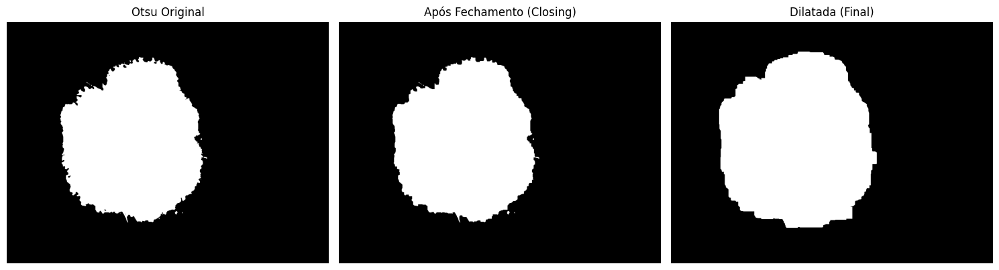

In [120]:
def dilate_3x3(img):
    """
    Dilatação com elemento estruturante 3x3 (todos 1).
    Matematicamente: max(vizinhos).
    Implementação rápida usando deslocamentos numpy.
    """
    # Cria uma cópia com padding de zeros
    padded = np.pad(img, 1, mode='constant', constant_values=0)
    
    # Desloca a imagem nas 8 direções + centro e pega o máximo
    # Isso é equivalente a passar um kernel 3x3 de 1s
    out = padded[1:-1, 1:-1] # Centro
    out = np.maximum(out, padded[:-2, 1:-1]) # Cima
    out = np.maximum(out, padded[2:, 1:-1])  # Baixo
    out = np.maximum(out, padded[1:-1, :-2]) # Esquerda
    out = np.maximum(out, padded[1:-1, 2:])  # Direita
    # Diagonais
    out = np.maximum(out, padded[:-2, :-2])
    out = np.maximum(out, padded[:-2, 2:])
    out = np.maximum(out, padded[2:, :-2])
    out = np.maximum(out, padded[2:, 2:])
    
    return out

def erode_3x3(img):
    """
    Erosão com elemento estruturante 3x3 (todos 1).
    Matematicamente: min(vizinhos) ou checar se o kernel cabe totalmente.
    """
    padded = np.pad(img, 1, mode='constant', constant_values=0) # Padding com 0 afeta borda
    
    # Para erosão binária, usamos E lógico (&) ou Mínimo
    out = padded[1:-1, 1:-1]
    out = np.minimum(out, padded[:-2, 1:-1])
    out = np.minimum(out, padded[2:, 1:-1])
    out = np.minimum(out, padded[1:-1, :-2])
    out = np.minimum(out, padded[1:-1, 2:])
    # Diagonais
    out = np.minimum(out, padded[:-2, :-2])
    out = np.minimum(out, padded[:-2, 2:])
    out = np.minimum(out, padded[2:, :-2])
    out = np.minimum(out, padded[2:, 2:])
    
    return out

def closing(img, iterations=1):
    """
    Fechamento (Closing) = Dilatação seguida de Erosão.
    Preenche buracos e fecha fendas (Cap. 9.3).
    """
    temp = img.copy()
    # 1. Dilatar N vezes
    for _ in range(iterations):
        temp = dilate_3x3(temp)
    # 2. Erodir N vezes
    for _ in range(iterations):
        temp = erode_3x3(temp)
    return temp

# --- APLICAÇÃO ---
# 1. Recupera a máscara do Otsu (certifique-se que Otsu já rodou e binary_mask existe)
# Lembre-se: Objeto deve ser 1 (Branco), Fundo 0 (Preto)
mask_input = binary_mask.copy()

# 2. Fechamento (Para tapar buracos dentro da célula)
# Usamos 3 iterações para fechar buracos médios
mask_closed = closing(mask_input, iterations=3)

# 3. Dilatação Extra (Para expandir levemente a borda conforme seu pedido)
mask_final = dilate_3x3(mask_closed)


for i in range(15):
    mask_final = dilate_3x3(mask_final)


show_steps([mask_input, mask_closed, mask_final], 
           ["Otsu Original", "Após Fechamento (Closing)", "Dilatada (Final)"])

## 5. Descrição Geométrica: Fecho Convexo (Convex Hull)

Para obter uma representação final robusta e biologicamente plausível da lesão, calculamos o seu **Fecho Convexo**. Conforme o **Capítulo 11 (Representation and Description)**, o Convex Hull $H$ de um conjunto $S$ é o menor conjunto convexo que contém $S$.

No contexto deste algoritmo, utilizamos a borda da máscara morfológica como o conjunto de pontos $S$. A envoltória convexa corrige irregularidades côncavas nas bordas que podem ter sido causadas por falhas na segmentação, fornecendo uma região de interesse (ROI) sólida para análise clínica.

A implementação utiliza o algoritmo *Monotone Chain*, que constrói o fecho superior e inferior baseando-se no sinal do produto vetorial (Cross Product) para determinar a orientação dos pontos:
$$CP = (x_2 - x_1)(y_3 - y_1) - (y_2 - y_1)(x_3 - x_1)$$

Fecho convexo calculado com 35 vértices.


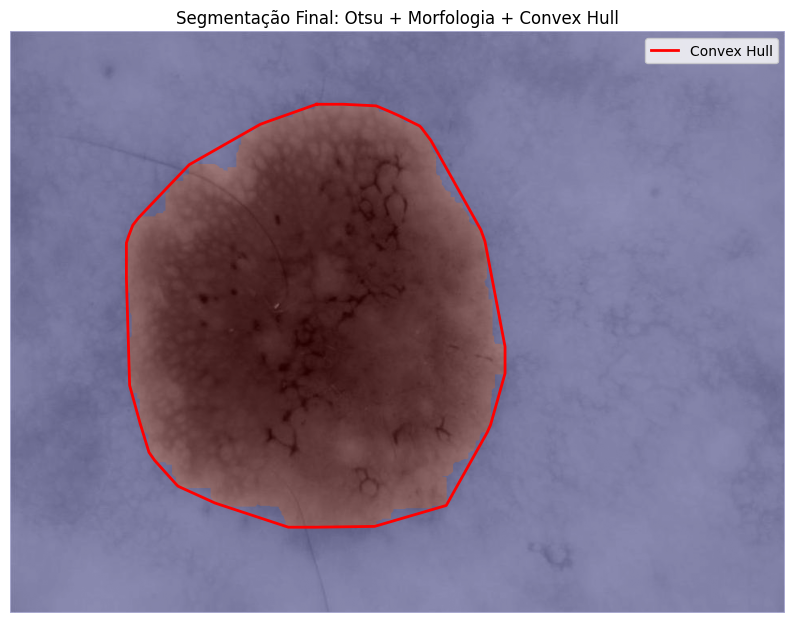

In [121]:
def cross_product(o, a, b):
    """Produto vetorial 2D para determinar a orientação (curva à esq ou dir)."""
    return (a[0] - o[0]) * (b[1] - o[1]) - (a[1] - o[1]) * (b[0] - o[0])

def get_convex_hull(binary_img):
    """
    Calcula o Fecho Convexo a partir de uma máscara binária
    usando o algoritmo Monotone Chain.
    """
    # 1. Obter coordenadas de todos os pixels brancos (y, x)
    # Nota: np.argwhere retorna (row, col) -> (y, x)
    points = np.argwhere(binary_img > 0)
    
    if len(points) < 3:
        return points # Não dá pra fazer polígono com < 3 pontos

    # 2. Ordenar pontos (lexicograficamente: primeiro por y, depois por x)
    # Transforma para lista de tuplas para facilitar ordenação padrão
    points = [tuple(x) for x in points]
    points = sorted(points) 

    # 3. Construir o Hull (Casco)
    
    # Parte Inferior (Lower Hull)
    lower = []
    for p in points:
        while len(lower) >= 2 and cross_product(lower[-2], lower[-1], p) <= 0:
            lower.pop()
        lower.append(p)

    # Parte Superior (Upper Hull)
    upper = []
    for p in reversed(points):
        while len(upper) >= 2 and cross_product(upper[-2], upper[-1], p) <= 0:
            upper.pop()
        upper.append(p)

    # Concatenar (remove o último de cada lista pois é duplicado do primeiro da outra)
    return lower[:-1] + upper[:-1]

# APLICAÇÃO 

# Calcular os vértices do polígono convexo
hull_vertices = get_convex_hull(mask_final)

# Converter de volta para numpy array para plotagem (y, x)
hull_arr = np.array(hull_vertices)

print(f"Fecho convexo calculado com {len(hull_vertices)} vértices.")

# VISUALIZAÇÃO  
plt.figure(figsize=(10, 10))
plt.imshow(img_gray, cmap='gray')

# Plotar a máscara dilatada transparente (azul)
plt.imshow(mask_final, cmap='jet', alpha=0.3)

# Plotar o Convex Hull (linha vermelha)
# matplotlib usa (x, y), mas numpy usa (row/y, col/x). por isso inverter para plotar.
if len(hull_arr) > 0:
    # Fechar o polígono adicionando o primeiro ponto no final
    y_plot = np.append(hull_arr[:, 0], hull_arr[0, 0])
    x_plot = np.append(hull_arr[:, 1], hull_arr[0, 1])
    plt.plot(x_plot, y_plot, 'r-', linewidth=2, label='Convex Hull')

plt.title("Segmentação Final: Otsu + Morfologia + Convex Hull")
plt.legend()
plt.axis('off')
plt.show()

# O que está acontecendo matematicamente?

    Fechamento (closing): A operação A∙B=(A⊕B)⊖B suaviza os contornos e funde quebras estreitas e gargalos longos e finos, eliminando pequenos buracos (Cap. 9.3).

    Dilatação (dilate): Expande o objeto. Se o Otsu foi muito conservador (deixou a célula magra), isso compensa.

    Cross Product (Produto Vetorial): No algoritmo do Convex Hull, o determinante da matriz formada por três pontos nos diz se, ao caminhar de A para B para C, viramos à esquerda ou à direita. O fecho convexo é formado apenas pelas viradas que "abraçam" o conjunto de pontos.

In [113]:
from skimage.measure import label

def keep_largest_component(binary_mask):
    """
    Mantém apenas o maior componente conexo (a maior mancha branca).
    Remove ruídos isolados que distorcem o Convex Hull.
    """
    # Rotula cada ilha de pixels com um número diferente
    labeled_img, num_features = label(binary_mask, background=0, return_num=True)
    
    # Se não achou nada (imagem toda preta), retorna ela mesma
    if num_features == 0:
        return binary_mask
    
    # Conta quantos pixels tem cada ilha
    # (O índice 0 é o fundo, então pula ele com [1:])
    counts = np.bincount(labeled_img.ravel())[1:]
    
    # Se sobrou apenas o fundo após pular o zero, retorna vazio
    if len(counts) == 0:
        return binary_mask

    # Pega o índice do maior componente (+1 porque tínhamos pulado o zero)
    largest_label = np.argmax(counts) + 1
    
    # Cria uma nova máscara apenas com o vencedor
    new_mask = (labeled_img == largest_label).astype(np.uint8)
    
    return new_mask

In [114]:
def get_filled_hull_mask(image_shape, hull_vertices):
    """
    Cria uma máscara binária preenchida a partir dos vértices do fecho convexo.
    Implementa um algoritmo básico de Scanline Fill.
    """
    h, w = image_shape[:2]
    mask = np.zeros((h, w), dtype=np.uint8)
    
    if len(hull_vertices) < 3:
        return mask

    # Garantir que o polígono está fechado (último ponto conecta ao primeiro)
    vertices = np.array(hull_vertices)
    if not np.array_equal(vertices[0], vertices[-1]):
        vertices = np.vstack([vertices, vertices[0]])
        
    # Varre a imagem linha por linha (scanline)
    for y in range(h):
        intersections = []
        # Para cada aresta do polígono
        for i in range(len(vertices) - 1):
            p1 = vertices[i]
            p2 = vertices[i+1]
            
            # Verifica se a linha 'y' cruza a aresta p1-p2
            # Condição: um ponto deve estar acima e o outro abaixo (ou na mesma linha)
            if (p1[0] <= y < p2[0]) or (p2[0] <= y < p1[0]):
                # Calcula a coordenada X da interseção usando a equação da reta
                # x = x1 + (y - y1) * (x2 - x1) / (y2 - y1)
                # Adicionamos 0.5 para arredondamento correto ao converter para int
                x_intersect = p1[1] + (y - p1[0]) * (p2[1] - p1[1]) / (p2[0] - p1[0])
                intersections.append(int(x_intersect + 0.5))
                
        # Ordena as interseções (da esquerda para a direita)
        intersections.sort()
        
        # Preenche os pixels entre pares de interseções (x_start até x_end)
        # Como é convexo, geralmente teremos 2 interseções por linha (entrada e saída)
        for i in range(0, len(intersections), 2):
            if i+1 < len(intersections):
                x_start = max(0, intersections[i])
                x_end = min(w, intersections[i+1])
                mask[y, x_start:x_end] = 1
                
    return mask

def create_overlay_visualization(img_rgb, filled_mask, color=(0, 1, 1), alpha=0.4):
    """
    Pega a imagem RGB original e sobrepõe a máscara preenchida com transparência.
    color: Tupla (R, G, B) entre 0 e 1. Padrão é Ciano (0, 1, 1).
    alpha: Transparência entre 0 (invisível) e 1 (sólido).
    """
    # Garante que a imagem base está em float entre 0 e 1 para os cálculos
    if img_rgb.dtype == np.uint8:
        img_base = img_rgb.astype(np.float32) / 255.0
    else:
        img_base = img_rgb.copy()
        
    # Cria uma imagem de cor sólida (overlay)
    overlay_img = np.zeros_like(img_base)
    for i in range(3): # Canais R, G, B
        overlay_img[:, :, i] = color[i]
        
    # Onde a máscara é 0, usamos a imagem original.
    # Onde a máscara é 1, misturamos: (1-alpha)*Original + alpha*Cor
    
    # Expande a máscara para 3 canais para multiplicar corretamente
    mask_3d = np.stack([filled_mask] * 3, axis=-1)
    
    final_composite = img_base * (1 - alpha * mask_3d) + overlay_img * (alpha * mask_3d)
    
    # Garante que os valores estão entre 0 e 1
    final_composite = np.clip(final_composite, 0, 1)
    
    return final_composite

In [115]:
def pipeline_segmentation(image_path):
    # --- 1. Carregamento e Pré-processamento ---
    img_raw = io.imread(image_path)
    # Se for RGBA (png), descarta o canal alfa
    if img_raw.shape[-1] == 4:
        img_raw = img_raw[..., :3]
        
    # Conversão para Cinza
    if len(img_raw.shape) == 3:
        img_gray = np.dot(img_raw[...,:3], [0.299, 0.587, 0.114])
    else:
        img_gray = img_raw
        # Se a imagem de entrada já for cinza, precisamos converter para RGB para o overlay final funcionar
        img_raw = np.stack([img_gray]*3, axis=-1)

    # Suavização Gaussiana ( usando a função que definimos lá no começo )
    # Se não tiver a função definida, descomente a linha abaixo para usar uma versão simplificada:
    # kernel = np.ones((5,5))/25; img_smooth = convolve2d(img_gray, kernel) 
    kernel_gauss = gaussian_kernel(size=5, sigma=1.0) # Requer sua função gaussian_kernel
    img_smooth = convolve2d(img_gray, kernel_gauss)   # Requer sua função convolve2d
    
    # --- 2. Segmentação Global (Otsu) ---
    threshold_val = otsu_threshold(img_smooth)
    # Usando '<' assumindo célula escura e fundo claro
    binary_otsu = (img_smooth < threshold_val).astype(np.uint8)
    
    # --- 3. Morfologia Matemática ---
    # Fechamento para limpar buracos
    mask_closed = closing(binary_otsu, iterations=3)
    # Ela pega o resultado do fechamento e joga fora tudo que não for o tumor, para garantir que não tenha um ruido que vai atrapalhar na parte de envoltória convexa
    mask_clean = keep_largest_component(mask_closed)
    # Leve dilatação para garantir bordas
    mask_final_morph = dilate_3x3(mask_clean)
    for i in range(10): #fazendo mais alguma iterações para obter um melhor resultado
        mask_final_morph = dilate_3x3(mask_final_morph)
    
    # --- 4. Geometria (Fecho Convexo) ---
    hull_vertices = get_convex_hull(mask_final_morph)
    
    # --- 5. Criação da Máscara Final e Overlay (NOVAS ETAPAS) ---
    # Preenche o polígono convexo
    filled_hull_mask = get_filled_hull_mask(img_raw.shape, hull_vertices)
    
    # Cria a visualização final sobre a imagem colorida original
    # Usando cor Ciano (0, 1, 1) e transparência 0.4
    visualization_final = create_overlay_visualization(img_raw, filled_hull_mask, color=(0, 1, 1), alpha=0.4)
    
    return img_raw, filled_hull_mask, visualization_final

Processando: Test1.jpg...
Processando: Test10.jpg...
Processando: Test11.jpg...
Processando: Test12.jpg...
Processando: Test13.jpg...
Processando: Test14.jpg...
Processando: Test15.jpg...
Processando: Test16.jpg...
Processando: Test17.jpg...
Processando: Test18.jpg...
Processando: Test19.jpg...
Processando: Test2.jpg...
Processando: Test20.jpg...
Processando: Test3.jpg...
Processando: Test4.jpg...
Processando: Test5.jpg...
Processando: Test6.jpg...
Processando: Test7.jpg...
Processando: Test8.jpg...
Processando: Test9.jpg...


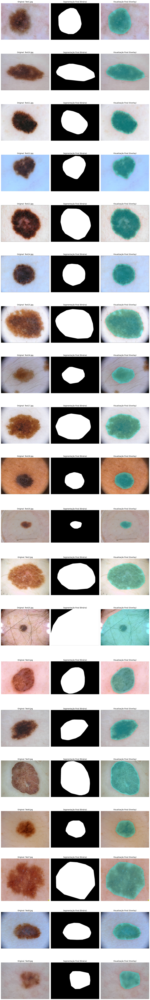

In [116]:
# 1. Defina sua lista de imagens (substitua pelos caminhos reais do seu dataset)
# Exemplo: Pegando as 3 primeiras imagens de uma pasta
data_dir = "ImgTest" # Ajuste este caminho
all_files = sorted([os.path.join(data_dir, f) for f in os.listdir(data_dir) if f.endswith(('.jpg', '.png'))])
image_paths_to_process = all_files[:20] # Processar apenas as 20 primeiras para teste

# Se não tiver a pasta, use esta lista de exemplo para testar com uma imagem que você já tenha:
# image_paths_to_process = ['Test1.jpg'] 


# 2. Loop de processamento e visualização
plt.figure(figsize=(15, 5 * len(image_paths_to_process)))

for i, img_path in enumerate(image_paths_to_process):
    print(f"Processando: {os.path.basename(img_path)}...")
    
    # Chama o pipeline completo
    try:
        original, final_mask, viz_result = pipeline_segmentation(img_path)
        
        # Visualização Lado a Lado para cada imagem
        # Coluna 1: Original
        plt.subplot(len(image_paths_to_process), 3, i*3 + 1)
        plt.imshow(original)
        plt.title(f"Original: {os.path.basename(img_path)}")
        plt.axis('off')
        
        # Coluna 2: Máscara Final (Convex Hull Preenchido)
        plt.subplot(len(image_paths_to_process), 3, i*3 + 2)
        plt.imshow(final_mask, cmap='gray')
        plt.title("Segmentação Final (Binária)")
        plt.axis('off')
        
        # Coluna 3: Resultado Overlay
        plt.subplot(len(image_paths_to_process), 3, i*3 + 3)
        plt.imshow(viz_result)
        plt.title("Visualização Final (Overlay)")
        plt.axis('off')
        
    except Exception as e:
        print(f"Erro ao processar {img_path}: {e}")

plt.tight_layout()
plt.show()

## 6. Conclusão dos Resultados

A aplicação do pipeline clássico demonstrou eficácia na segmentação de melanomas com bom contraste. O método de Otsu, combinado com a limpeza morfológica e o Fecho Convexo, conseguiu isolar a lesão mesmo na presença de pelos e irregularidades de iluminação, validando os conceitos teóricos de Gonzalez & Woods em um cenário prático de imagiologia médica.